# Background measurements at Utgård
> __Author:__ A. Backis
<br/>__Institute:__ European Spallation Source (ESS), University of Glasgow
<br/>__Date:__ 7/2-2020

_Abstract:_
This notebook contains the data-analysis for measurements conducted at Utgård 06-2019 to 12-2019. The notebook presents a summary of all the measurements conducted and compares them to each other.

# Contents
* [1. Introduction](#INTRODUCTION)
    * [1.1 Packages](#PACKAGES)
* [2. Data](#DATA)
    * [2.1 Declare paths](#PATHS)
    * [2.2 Extract data](#EXTRACT)
    * [2.3 Declare filters](#FILTER)
* [3. Background measurements](#MEASUREMENTS)
    * [3.1 SEQUOIA](#SEQUOIA)
    * [3.2 Utgård - part 1](#UTGARD_1)
    * [3.3 Utgård - part 2](#UTGARD_2)
* [4. Analysis](#ANALYSIS)
* [Acknowledgements](#ACKNOWLEDGEMENTS)
* [References](#REFERENCES)

# 1. Introduction<a class="anchor" id="INTRODUCTION"></a>

## 1.1 Packages<a class="anchor" id="PACKAGES"></a>

In [1]:
# Autoload packages when doing an external change
%load_ext autoreload
%autoreload 2

# Make matplotlib interactive mode in notebook
%matplotlib inline
%matplotlib notebook

# General packages
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# Data handling
import mg.file_handling.read as mg_read

# Plotting
import mg.plotting.basic_plot as mg_basic_plot
import mg.plotting.advanced_plot as mg_advanced_plot

# Helper functions
import mg.helper_functions.misc as mg_hf

# 2. Data<a class="anchor" id="DATA"></a>

## 2.1 Declare paths

In [2]:
# Declare folder to raw data
folder = '../data/utgard_measurements/raw/'

# Paths to background measurement at SEQUOIA
background_at_sequoia_path = folder + 'mvmelst_039.zip'

# Paths to Anton's background measurements at Utgård
anton_68h_no_shielding_path = folder + 'mvmelst_042_noShielding_68h.zip'
anton_287h_no_shielding_path = folder + 'mvmelst_042_NoShileding_1100V_286h49m.zip'
anton_268h_no_shielding_upright_path = folder + 'mvmelst_047_NoShielding_Upright_1100V_268h16m.zip'
anton_46h_no_shielding_upright_path = folder + 'mvmelst_078_2det_45h56m_1vertical.zip'
anton_69h_shielding_path = folder + 'mvmelst_035_Shielding_1100V_69h20m.zip'
anton_114h_shielding_path = folder + 'mvmelst_045_Shielding_1100V_114h22m.zip'

# Paths to Ramsey's & Alex's follow-up background measurements at Utgård
seqI_no_shielding_path = folder + 'mvmelst_179_191118_065800_SEQUOIA_II_18_11_2019_to_20_11_2019_no_mirrorbor_shielding.zip'
seqI_mirrorbor_shielding_front_path = folder + 'mvmelst_177_191115_095131_SEQUOIA__II_15_11_2019_to_18_11_2019_mirrorbor_covering_detector_front.zip'
seqI_mirrorbor_shielding_front_and_back_path = folder + 'mvmelst_181_191120_100402_SEQUOIA__II_20_11_2019_to_22_11_2019_mirrorbor_shielding_top_and_bottom.zip'
seqI_mirrorbor_shielding_front_and_back_setup_2_path = folder + 'mvmelst_185_191125_091109_SEQUOIA_II_25_11_2019_to_29_11_2019_mirrorbor_shielding_top_and_bottom_setup_2_attempt_2.zip'
seqI_inside_new_cave_path = folder + 'mvmelst_189_191205_093810_SEQUOIA_I_06_12_2019_to_09_12_2019_inside_new_cave.zip'
seqII_mirrorbor_and_polyethylene_shielding_path = folder + 'mvmelst_188_191203_101632_SEQUOIA_II_1350_V_03_12_2019_to_05_12_2019_SEQUOIA_II_shielded_with_polyethylene_and_mirrorbor_sides_and_front.zip'

## 2.2 Extract data<a class="anchor" id="EXTRACT"></a>

In [3]:
# =============================================================================
#                    EXTRACT CLUSTERS AND INDIVIDUAL EVENTS
# =============================================================================

def extract_mg_data(zipped_path):
    unzipped_path = mg_read.unzip_data(zipped_path)
    data = mg_read.import_data(unzipped_path)
    # Extract clusters
    clusters = mg_read.extract_clusters(data)
    # Extract events 
    events = mg_read.extract_events(data)
    return clusters, events

In [4]:
# Background measurement at SEQUOIA
background_at_sequoia_clusters, background_at_sequoia_events = extract_mg_data(background_at_sequoia_path)

# Anton's background measurements at Utgård
#a_68h_ns_clu, a_68h_ns_ev = extract_mg_data(anton_68h_no_shielding_path)
a_287h_ns_clu, a_287h_ns_ev = extract_mg_data(anton_287h_no_shielding_path)
a_268h_ns_upright_clu, a_268h_ns_upright_ev = extract_mg_data(anton_268h_no_shielding_upright_path)
#a_46h_ns_upright_clu, a_46h_ns_upright_ev = extract_mg_data(anton_46h_no_shielding_upright_path)
a_69h_s_clu, a_69h_s_ev = extract_mg_data(anton_69h_shielding_path)
#a_114h_s_clu, a_114h_s_ev = extract_mg_data(anton_114h_shielding_path)

# Ramsey's & Alex's follow-up background measurements at Utgård
ra_ns_clu, ra_ns_ev = extract_mg_data(seqI_no_shielding_path)
ra_mb_front_clu, ra_mb_front_ev = extract_mg_data(seqI_mirrorbor_shielding_front_path)
ra_mb_front_back_clu, ra_mb_front_back_ev = extract_mg_data(seqI_mirrorbor_shielding_front_and_back_path)
ra_mb_front_back_2_clu, ra_mb_front_back_2_ev = extract_mg_data(seqI_mirrorbor_shielding_front_and_back_setup_2_path)
ra_mb_new_cave_clu, ra_mb_new_cave_ev = extract_mg_data(seqI_inside_new_cave_path)
ra_mb_seqII_mb_pe_clu, ra_mb_seqII_mb_pe_ev = extract_mg_data(seqII_mirrorbor_and_polyethylene_shielding_path)

Percentage: 0
Percentage: 1
Percentage: 3
Percentage: 4
Percentage: 5
Percentage: 7
Percentage: 8
Percentage: 9
Percentage: 11
Percentage: 12
Percentage: 13
Percentage: 15
Percentage: 16
Percentage: 17
Percentage: 19
Percentage: 20
Percentage: 22
Percentage: 23
Percentage: 24
Percentage: 26
Percentage: 27
Percentage: 28
Percentage: 30
Percentage: 31
Percentage: 32
Percentage: 34
Percentage: 35
Percentage: 36
Percentage: 38
Percentage: 39
Percentage: 40
Percentage: 42
Percentage: 43
Percentage: 44
Percentage: 46
Percentage: 47
Percentage: 48
Percentage: 50
Percentage: 51
Percentage: 52
Percentage: 54
Percentage: 55
Percentage: 56
Percentage: 58
Percentage: 59
Percentage: 60
Percentage: 62
Percentage: 63
Percentage: 65
Percentage: 66
Percentage: 67
Percentage: 69
Percentage: 70
Percentage: 71
Percentage: 73
Percentage: 74
Percentage: 75
Percentage: 77
Percentage: 78
Percentage: 79
Percentage: 81
Percentage: 82
Percentage: 83
Percentage: 85
Percentage: 86
Percentage: 87
Percentage: 89
Per

## 2.3 Declare filters<a class="anchor" id="FILTER"></a>

In [5]:
"""
Filters are declared in the following format:
{'PARAMETER': [MIN_VALUE, MAX_VALUE, IS_ACTIVATE]}
"""

# Filter: basic 
filter_basic = {'wm': [1, 1, True],                   # Wire multiplicity
                'gm': [1, 5, True],                   # Grid multiplicity
                'wadc': [500, np.inf, True],          # Wire charge
                'gadc': [500, np.inf, True],          # Grid charge
                'time': [0, np.inf, True],            # Time (TDC channels)
                'bus': [0, 2, True],                  # Bus
                'flag': [0, 1, False],                # =1 if different buses within same coincidence
                'layer': [0, 19, True],               # Layer, front=0 to back=19
                'row': [0, 11, True],                 # Row, right to left (seen from neutrons)
                'gch': [80, 119, True]}               # Grid channel, bottom=80 to top=119

# Filter: basic + edges removed
filter_no_edges = {'wm': [1, 1, True],                   # Wire multiplicity
                   'gm': [1, 5, True],                   # Grid multiplicity
                   'wadc': [500, np.inf, True],          # Wire charge
                   'gadc': [500, np.inf, True],          # Grid charge
                   'time': [0, np.inf, True],            # Time (TDC channels)
                   'bus': [0, 2, True],                  # Bus
                   'flag': [0, 1, False],                # =1 if different buses within same coincidence
                   'layer': [0, 19, True],               # Layer, front=0 to back=19
                   'row': [0, 11, True],                 # Row, right to left (seen from neutrons)
                   'gch': [81, 118, True]}               # Grid channel, bottom=80 to top=119

# Filter: basic + edges removed + back removed
filter_no_edges_no_back = {'wm': [1, 1, True],                   # Wire multiplicity
                           'gm': [1, 5, True],                   # Grid multiplicity
                           'wadc': [500, np.inf, True],          # Wire charge
                           'gadc': [500, np.inf, True],          # Grid charge
                           'time': [0, np.inf, True],            # Time (TDC channels)
                           'bus': [0, 2, True],                  # Bus
                           'flag': [0, 1, False],                # =1 if different buses within same coincidence
                           'layer': [0, 15, True],               # Layer, front=0 to back=19
                           'row': [0, 11, True],                 # Row, right to left (seen from neutrons)
                           'gch': [81, 118, True]}               # Grid channel, bottom=80 to top=119

# Filter: basic + edges removed + high ADC threshold
filter_no_edges_high_adc_thres = {'wm': [1, 1, True],                   # Wire multiplicity
                                  'gm': [1, 5, True],                   # Grid multiplicity
                                  'wadc': [1200, np.inf, True],          # Wire charge
                                  'gadc': [1200, np.inf, True],          # Grid charge
                                  'time': [0, np.inf, True],            # Time (TDC channels)
                                  'bus': [0, 2, True],                  # Bus
                                  'flag': [0, 1, False],                # =1 if different buses within same coincidence
                                  'layer': [0, 19, True],               # Layer, front=0 to back=19
                                  'row': [0, 11, True],                 # Row, right to left (seen from neutrons)
                                  'gch': [83, 116, True]}               # Grid channel, bottom=80 to top=119

# Filter: basic + edges removed + high ADC threshold, adapted for different buses
filter_no_edges_high_adc_thres_2_4 = {'wm': [1, 1, True],                   # Wire multiplicity
                        'gm': [1, 5, True],                   # Grid multiplicity
                        'wadc': [1200, np.inf, True],          # Wire charge
                        'gadc': [1200, np.inf, True],          # Grid charge
                        'time': [0, np.inf, True],            # Time (TDC channels)
                        'bus': [2, 4, True],                  # Bus
                        'flag': [0, 1, False],                # =1 if different buses within same coincidence
                        'layer': [0, 19, True],               # Layer, front=0 to back=19
                        'row': [0, 11, False],                 # Row, right to left (seen from neutrons)
                        'gch': [83, 116, True]}               # Grid channel, bottom=80 to top=119

# Filter: basic + edges removed + high ADC threshold, adapted for different buses
time_lim = (25 * 60 * 60) / (62.5e-9)
filter_no_edges_high_adc_thres_6_8 = {'wm': [1, 1, True],                   # Wire multiplicity
                        'gm': [1, 5, True],                   # Grid multiplicity
                        'wadc': [1200, np.inf, True],          # Wire charge
                        'gadc': [1200, np.inf, True],          # Grid charge
                        'time': [0, time_lim, True],            # Time (TDC channels)
                        'bus': [6, 8, True],                  # Bus
                        'flag': [0, 1, False],                # =1 if different buses within same coincidence
                        'layer': [0, 19, True],               # Layer, front=0 to back=19
                        'row': [0, 11, False],                 # Row, right to left (seen from neutrons)
                        'gch': [83, 116, True]}               # Grid channel, bottom=80 to top=119

# Filter: basic + edges removed + high ADC threshold, adapted for different buses
filter_no_edges_high_adc_thres_0_1 = {'wm': [1, 1, True],                   # Wire multiplicity
                        'gm': [1, 5, True],                   # Grid multiplicity
                        'wadc': [1200, np.inf, True],          # Wire charge
                        'gadc': [1200, np.inf, True],          # Grid charge
                        'time': [0, np.inf, True],            # Time (TDC channels)
                        'bus': [0, 1, True],                  # Bus
                        'flag': [0, 1, False],                # =1 if different buses within same coincidence
                        'layer': [0, 19, True],               # Layer, front=0 to back=19
                        'row': [0, 11, False],                 # Row, right to left (seen from neutrons)
                        'gch': [83, 116, True]}               # Grid channel, bottom=80 to top=119

# Filter: basic + edges removed + high ADC threshold, adapted for different buses
filter_no_edges_high_adc_thres_3_5 = {'wm': [1, 1, True],                   # Wire multiplicity
                        'gm': [1, 5, True],                   # Grid multiplicity
                        'wadc': [1200, np.inf, True],          # Wire charge
                        'gadc': [1200, np.inf, True],          # Grid charge
                        'time': [0, np.inf, True],            # Time (TDC channels)
                        'bus': [3, 5, True],                  # Bus
                        'flag': [0, 1, False],                # =1 if different buses within same coincidence
                        'layer': [0, 19, True],               # Layer, front=0 to back=19
                        'row': [0, 11, False],                 # Row, right to left (seen from neutrons)
                        'gch': [83, 116, True]}               # Grid channel, bottom=80 to top=119

# 3. Background measurements<a class="anchor" id="VISUALIZATION"></a>

In [6]:
def plot_all(clusters, events, cluster_filter, bus_start, bus_stop):
    # Declare parameters
    ce_filtered = mg_read.filter_data(clusters, cluster_filter)
    duration = (ce_filtered.time.values[-1] - ce_filtered.time.values[0]) * 62.5e-9
    
    # PHS - 2D
    fig = mg_basic_plot.phs_2d_plot(events, bus_start, bus_stop, '')
    fig.show()
    
    # PHS - grid vs adc
    fig = plt.figure()
    fig.set_figheight(4)
    fig.set_figwidth(14)
    plt.hist2d(clusters.gadc, clusters.gch, norm=LogNorm(), cmap='jet', bins=[100, 40],
               range=[[0, 4095], [79.5, 119.5]])
    plt.colorbar()
    plt.xlabel('Collected charge (adc channels)')
    plt.ylabel('Grid')
    fig.show()
    
    # PHS - 1D
    number_bins = 500
    interval = [0, 5000]
    fig = plt.figure()
    fig.set_figheight(4)
    fig.set_figwidth(14)
    plt.yscale('log')
    mg_basic_plot.phs_1d_plot(ce_filtered, number_bins, interval, '')
    fig.show()

    # PHS - wires vs grids
    fig = mg_basic_plot.phs_wires_vs_grids_plot(ce_filtered, bus_start, bus_stop, '')
    fig.show()
    

    # Coincidences - wires vs grids
    fig, __ = mg_basic_plot.ce_2d_plot(ce_filtered, duration, bus_start, bus_stop, '')
    fig.show()

    # Coincidences - projections
    fig = plt.figure()
    fig.set_figheight(4)
    fig.set_figwidth(14)
    mg_basic_plot.ce_projections_plot(ce_filtered, bus_start, bus_stop, '')
    fig.show()
    
    # Coincidences - 3D rotation
    #mg_basic_plot.ce_3d_plot(ce_filtered, '')

    # Counts - layer by layer, grid by grid
    fig = mg_advanced_plot.layers_counts(ce_filtered, duration, '')
    fig.show()

    # Rate
    fig = plt.figure()
    fig.set_figheight(4)
    fig.set_figwidth(14)
    number_bins = 200
    mg_basic_plot.rate_plot(ce_filtered, number_bins, '')
    fig.show()

## 3.1 SEQUOIA<a class="anchor" id="PHS"></a>

<IPython.core.display.Javascript object>


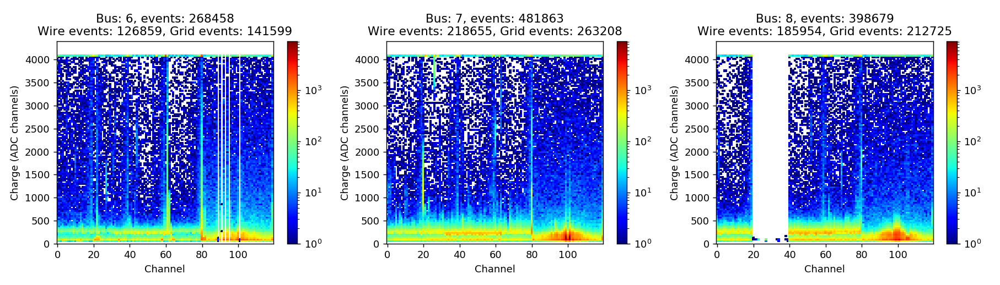

<IPython.core.display.Javascript object>


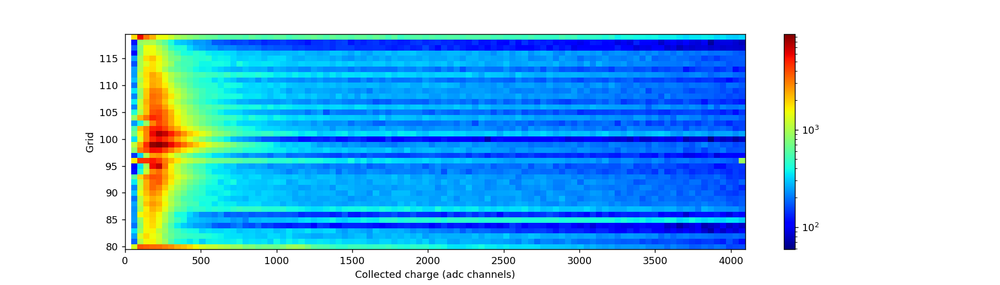

<IPython.core.display.Javascript object>


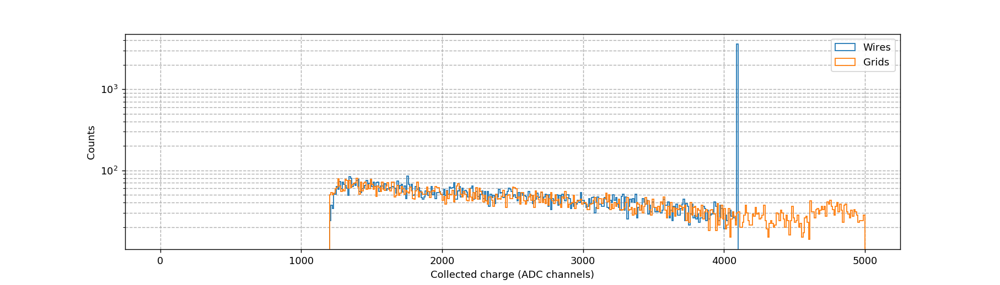

<IPython.core.display.Javascript object>


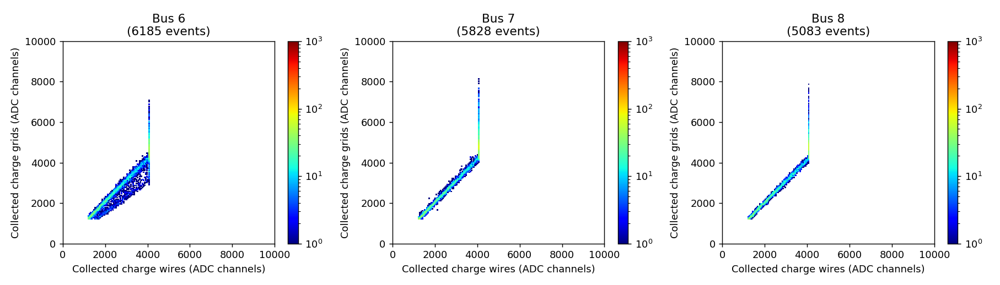

<IPython.core.display.Javascript object>


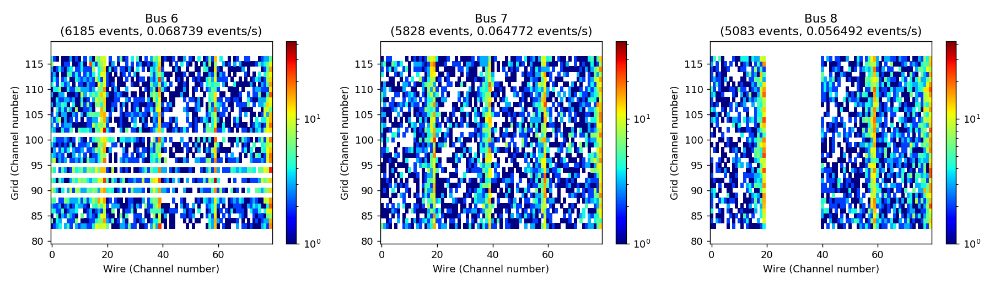

<IPython.core.display.Javascript object>


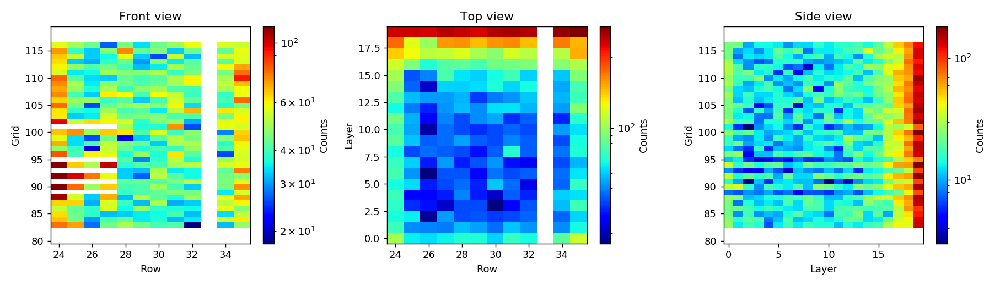

<IPython.core.display.Javascript object>


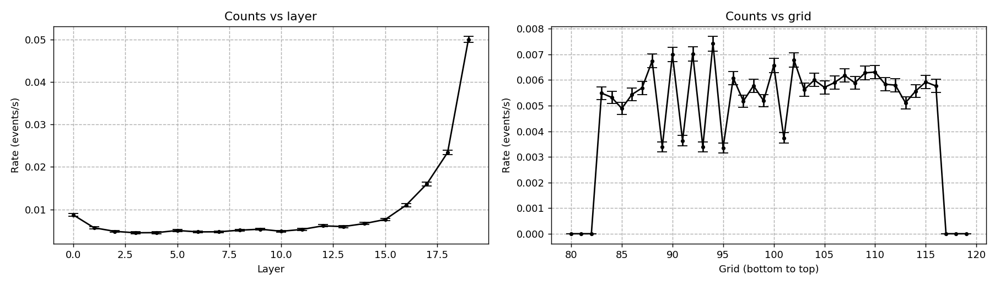

<IPython.core.display.Javascript object>


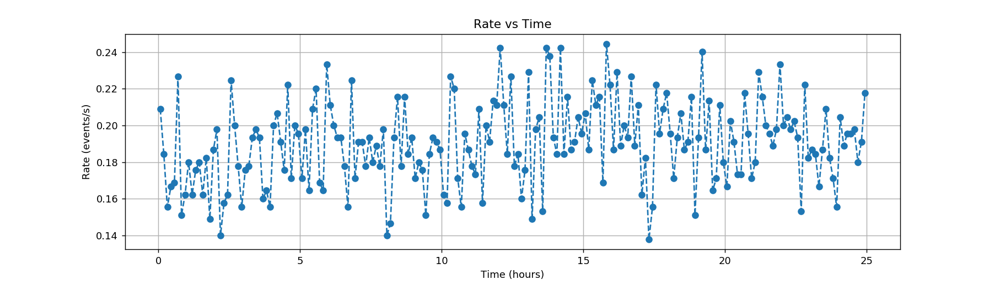

In [7]:
%matplotlib inline
%matplotlib notebook
bus_start, bus_stop = 6, 8
plot_all(background_at_sequoia_clusters, background_at_sequoia_events,
         filter_no_edges_high_adc_thres_6_8, bus_start, bus_stop)

## 3.2 Utgård - Part 1

### 3.2.1 SEQ I, Outside cave - horizontal

<IPython.core.display.Javascript object>


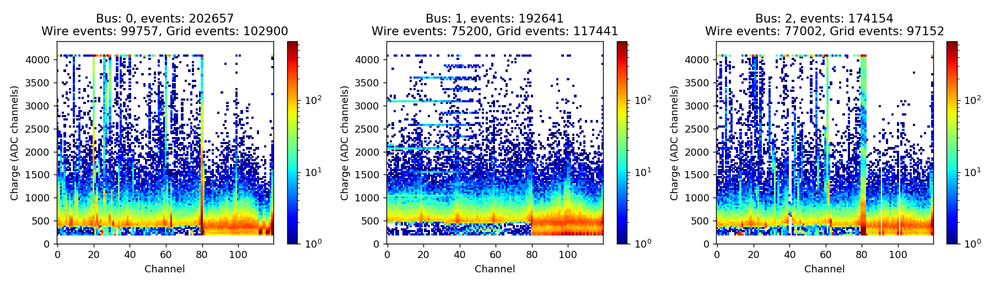

<IPython.core.display.Javascript object>


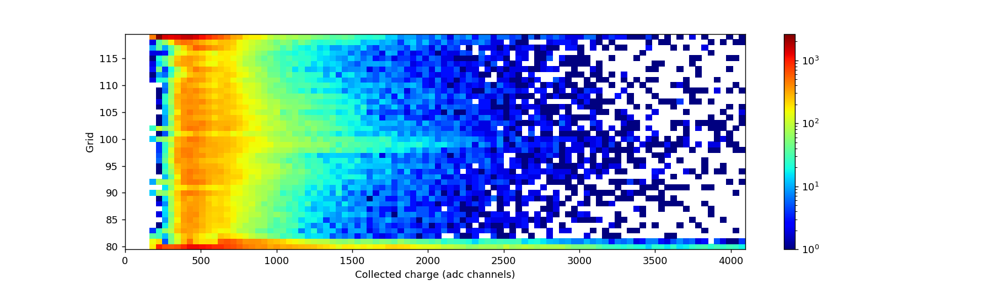

<IPython.core.display.Javascript object>


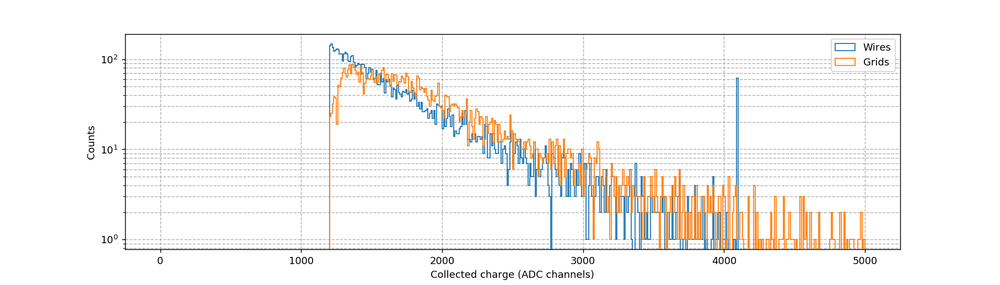

<IPython.core.display.Javascript object>


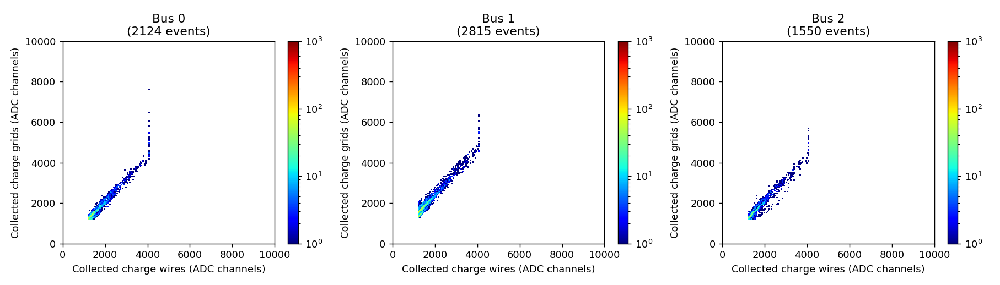

<IPython.core.display.Javascript object>


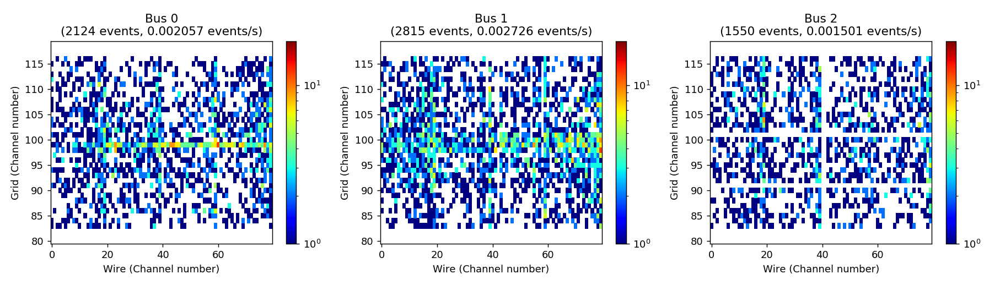

<IPython.core.display.Javascript object>


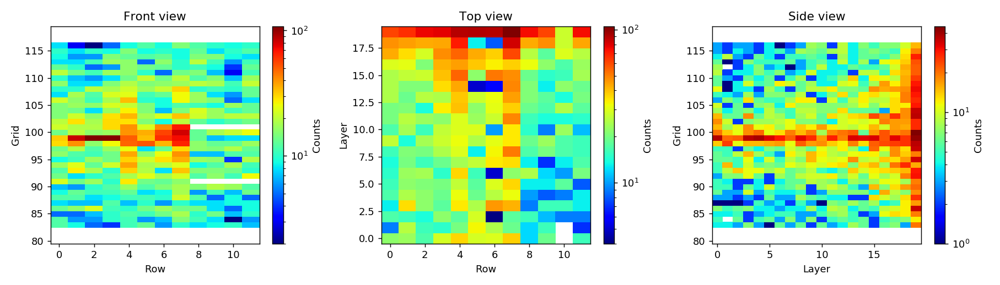

<IPython.core.display.Javascript object>


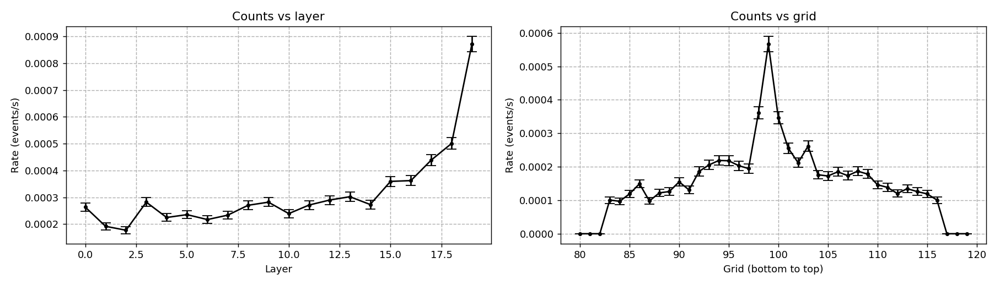

<IPython.core.display.Javascript object>


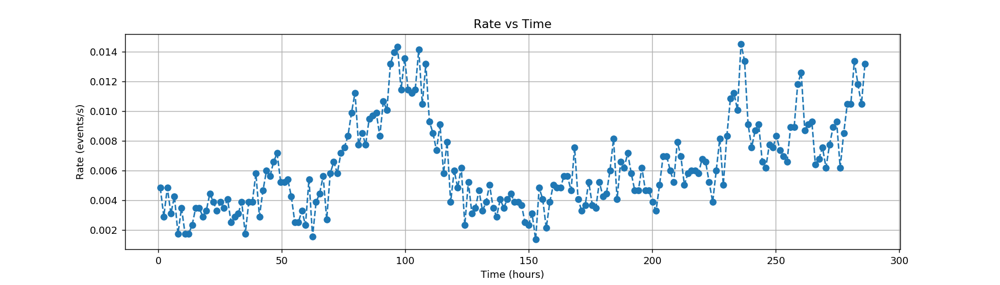

In [8]:
bus_start, bus_stop = 0, 2
plot_all(a_287h_ns_clu, a_287h_ns_ev, filter_no_edges_high_adc_thres, bus_start, bus_stop)

### 3.2.2 SEQ I, Outside cave - vertical

<IPython.core.display.Javascript object>


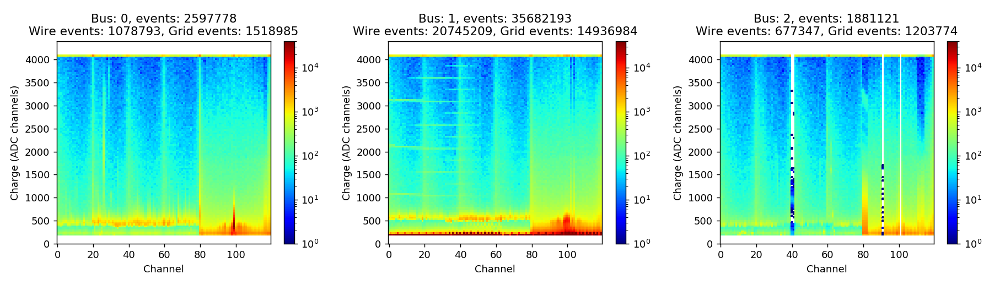

<IPython.core.display.Javascript object>


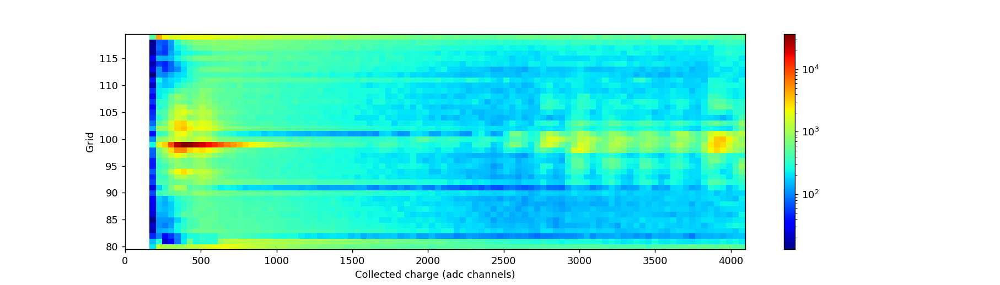

<IPython.core.display.Javascript object>


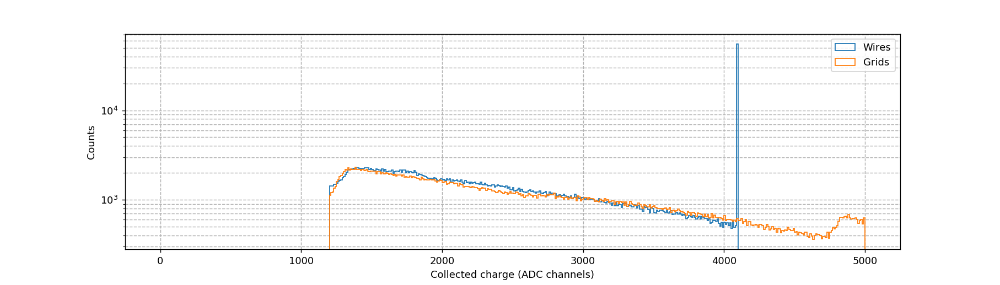

<IPython.core.display.Javascript object>


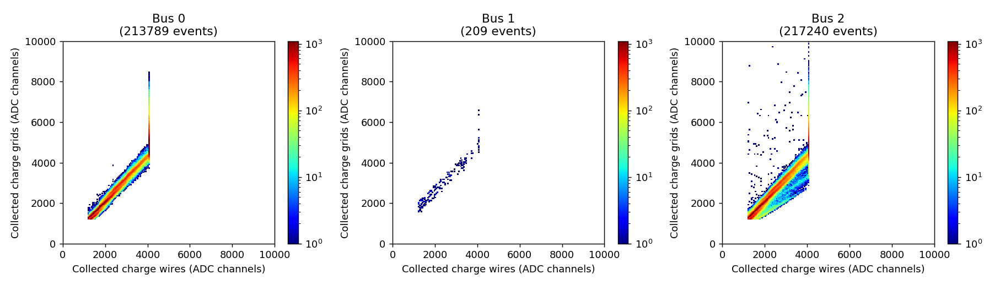

/Users/alexanderbackis/anaconda3/lib/python3.7/site-packages/matplotlib/pyplot.py:514: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).



<IPython.core.display.Javascript object>


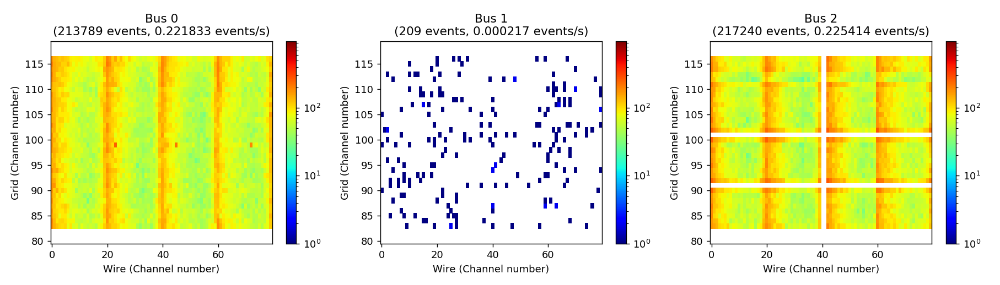

<IPython.core.display.Javascript object>


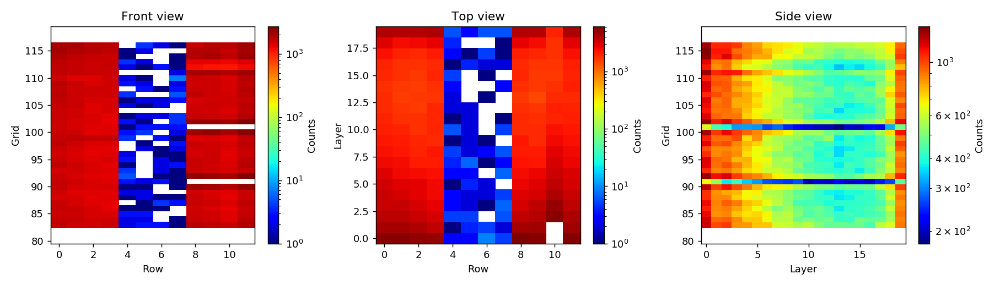

<IPython.core.display.Javascript object>


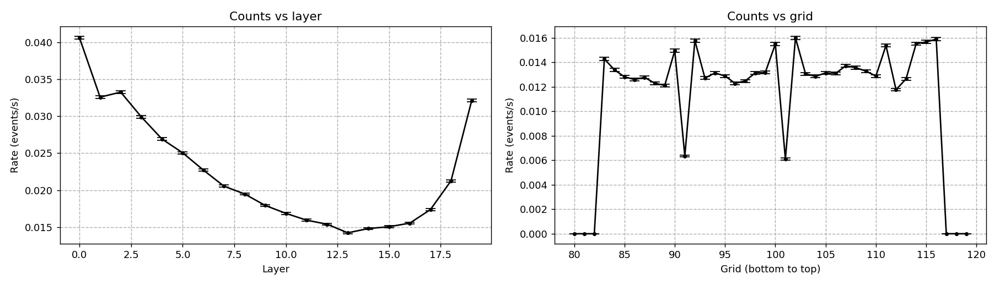

<IPython.core.display.Javascript object>


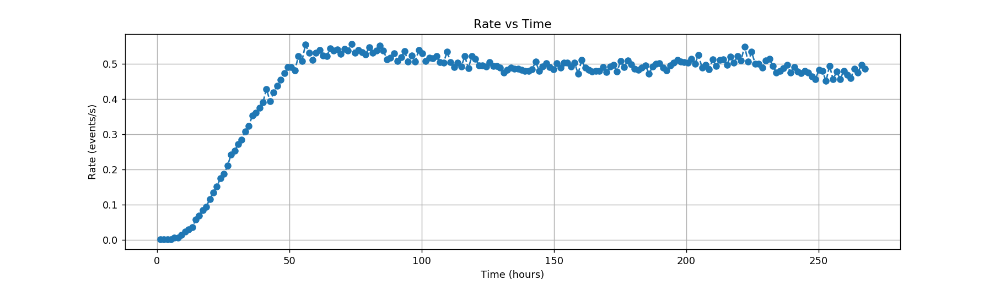

In [9]:
bus_start, bus_stop = 0, 2
plot_all(a_268h_ns_upright_clu, a_268h_ns_upright_ev, filter_no_edges_high_adc_thres, bus_start, bus_stop)

### 3.2.3 SEQ I, Inside cave

<IPython.core.display.Javascript object>


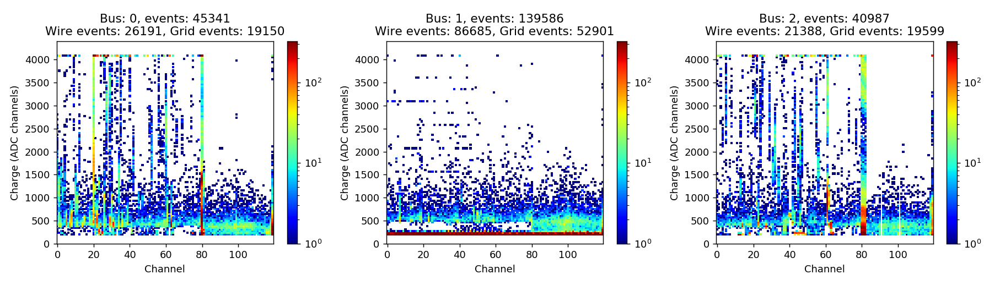

<IPython.core.display.Javascript object>


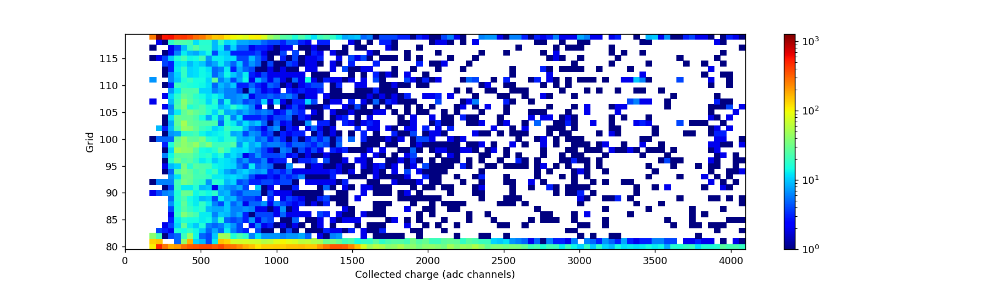

<IPython.core.display.Javascript object>


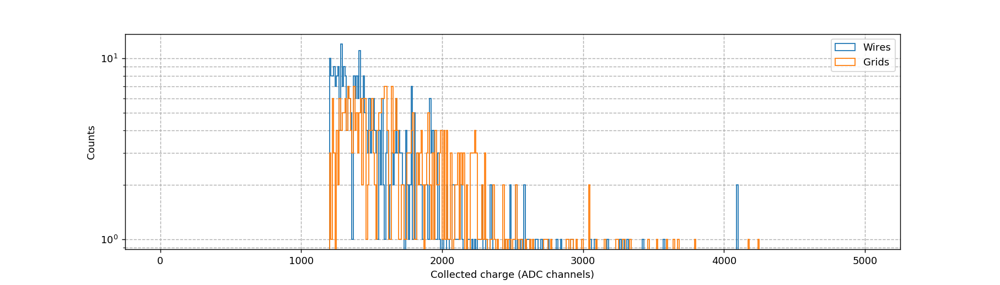

<IPython.core.display.Javascript object>


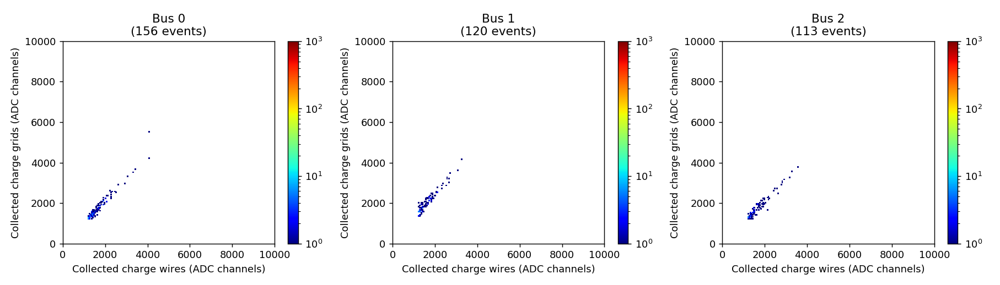

<IPython.core.display.Javascript object>


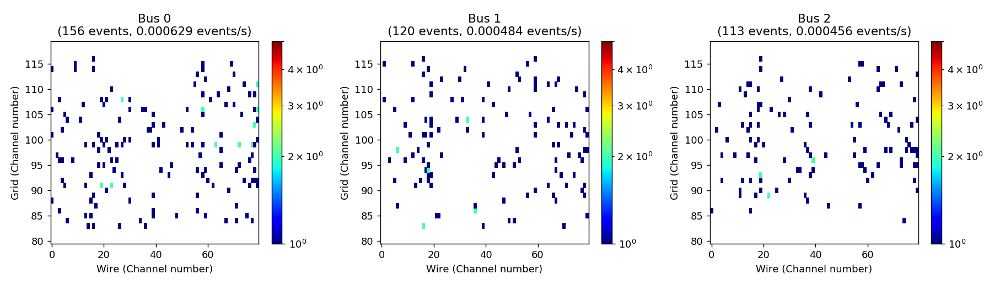

<IPython.core.display.Javascript object>


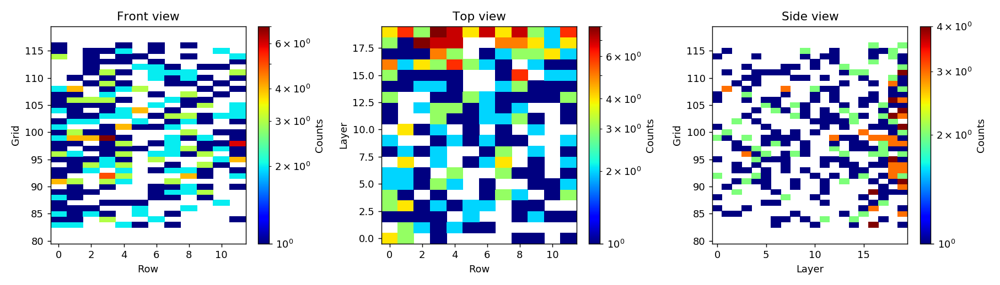

<IPython.core.display.Javascript object>


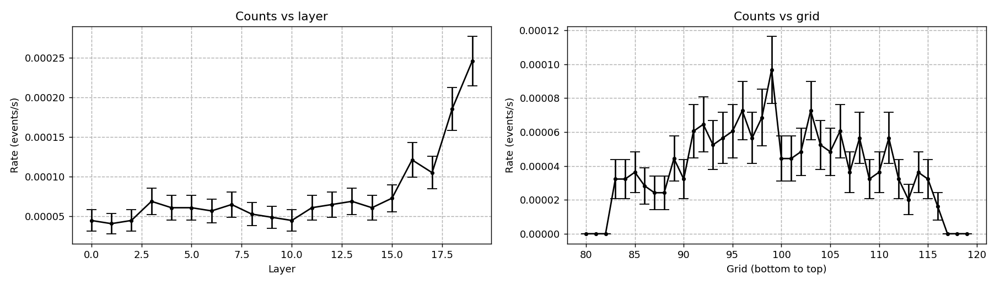

<IPython.core.display.Javascript object>


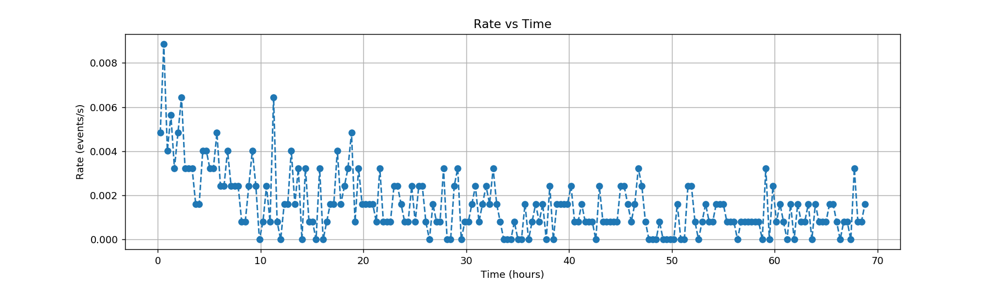

In [10]:
bus_start, bus_stop = 0, 2
plot_all(a_69h_s_clu, a_69h_s_ev, filter_no_edges_high_adc_thres, bus_start, bus_stop)

## 3.3 Utgård - Part 2

### 3.3.1 SEQ I, No shielding: - horizontal

<IPython.core.display.Javascript object>


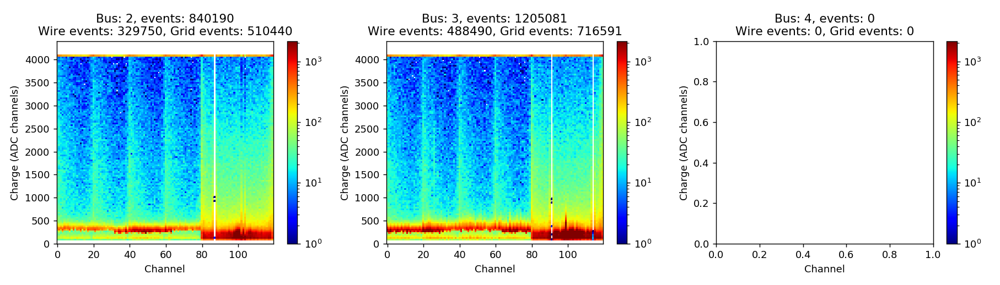

<IPython.core.display.Javascript object>


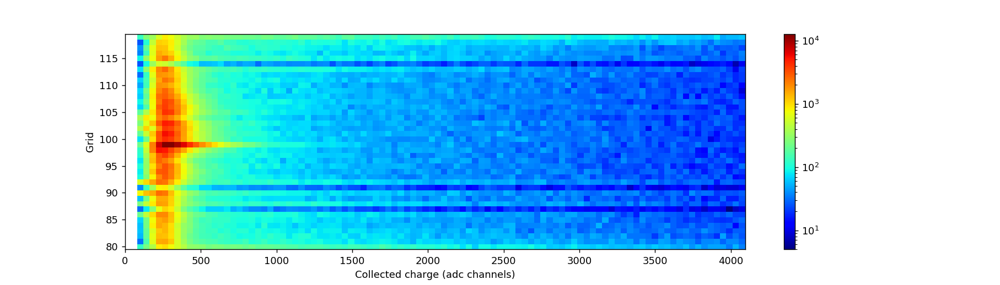

<IPython.core.display.Javascript object>


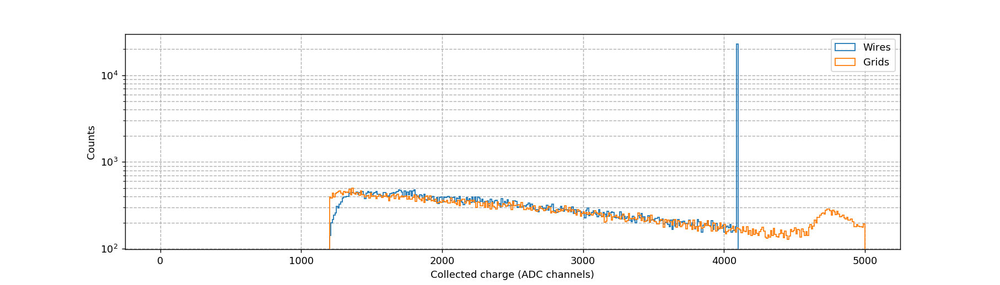

<IPython.core.display.Javascript object>


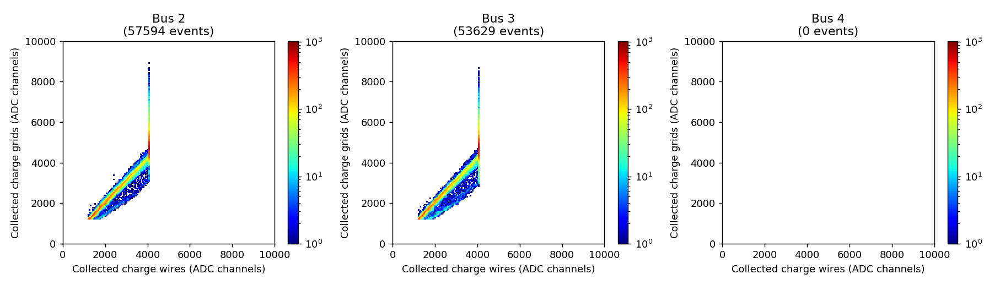

<IPython.core.display.Javascript object>


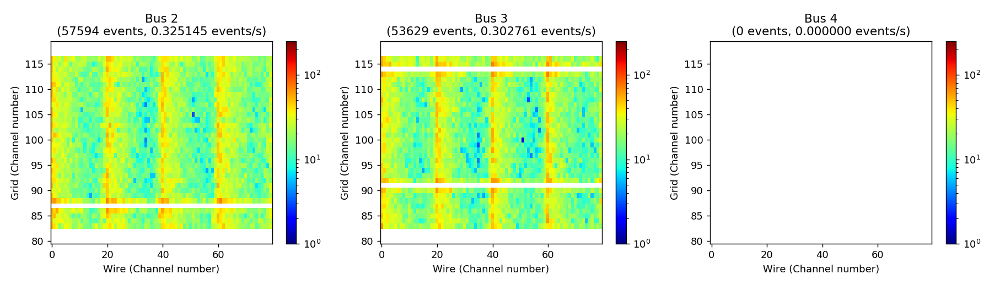

<IPython.core.display.Javascript object>


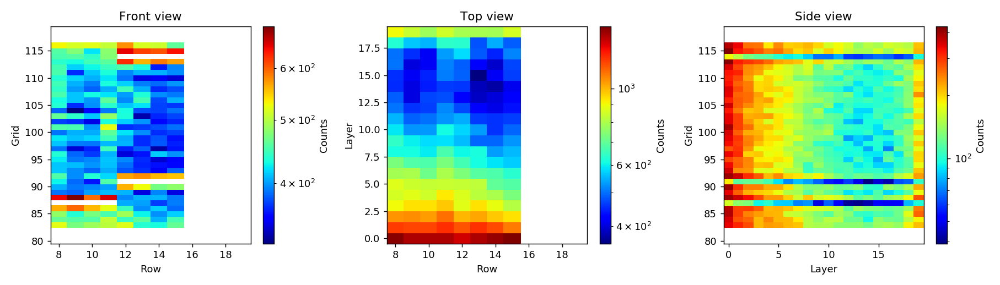

<IPython.core.display.Javascript object>


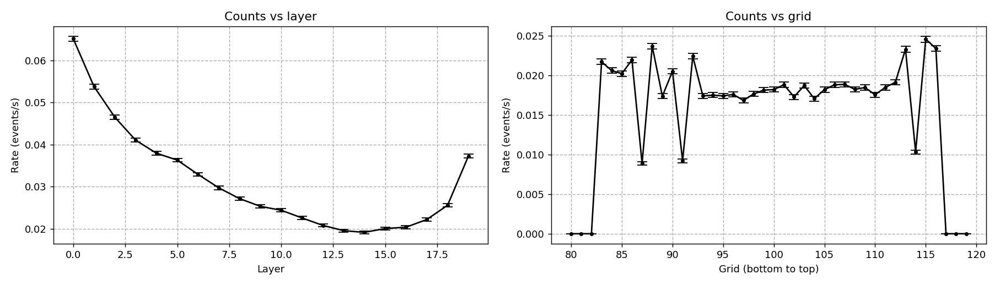

<IPython.core.display.Javascript object>


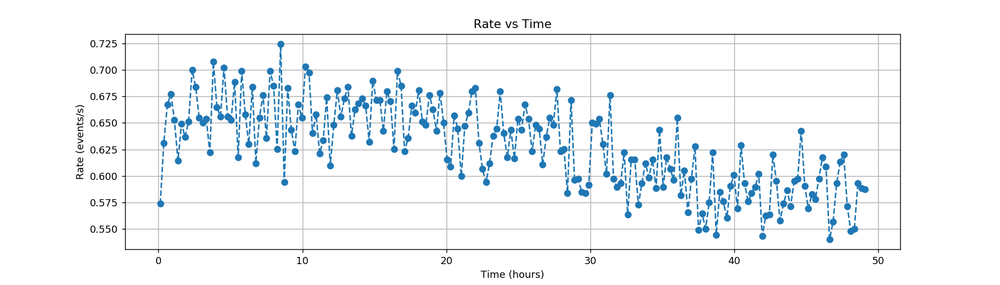

In [11]:
bus_start, bus_stop = 2, 4
plot_all(ra_ns_clu, ra_ns_ev, filter_no_edges_high_adc_thres_2_4, bus_start, bus_stop)

### 3.3.2 SEQ I, Mirrorbor shielding (front) - horizontal

<IPython.core.display.Javascript object>


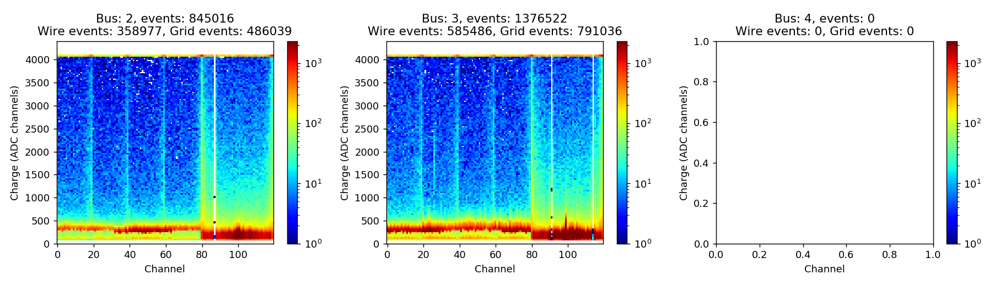

<IPython.core.display.Javascript object>


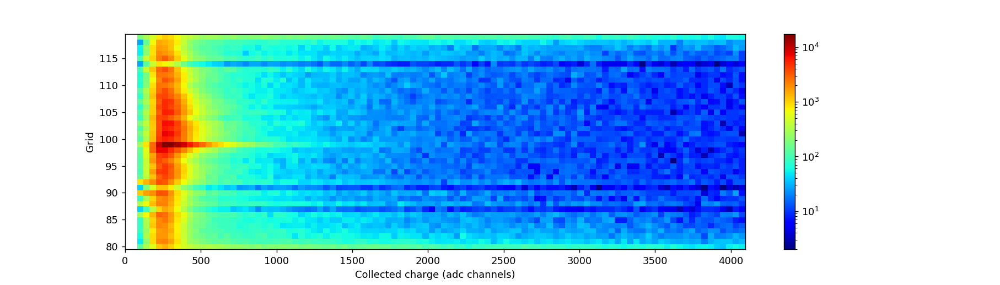

<IPython.core.display.Javascript object>


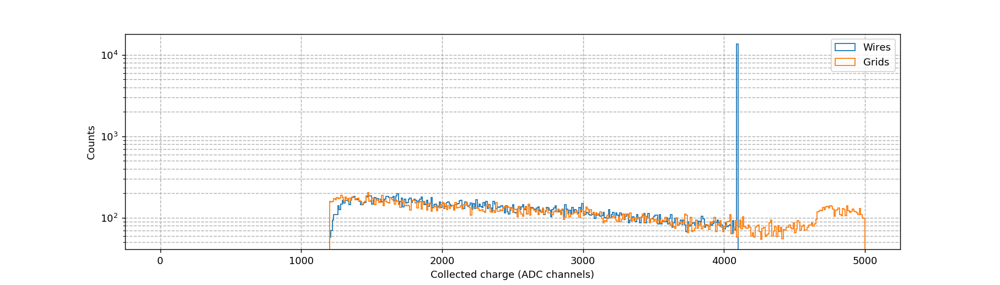

<IPython.core.display.Javascript object>


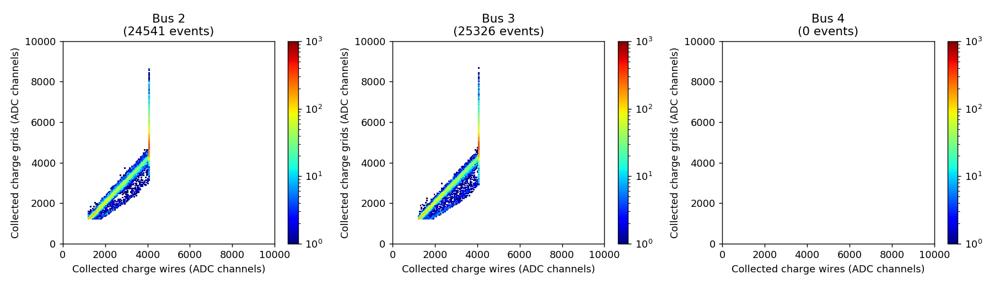

<IPython.core.display.Javascript object>


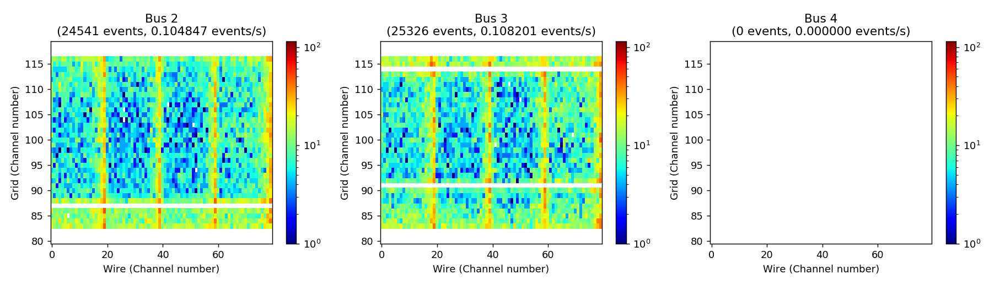

<IPython.core.display.Javascript object>


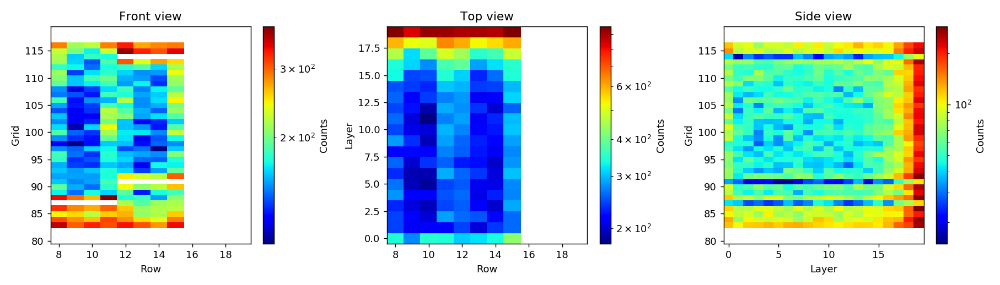

<IPython.core.display.Javascript object>


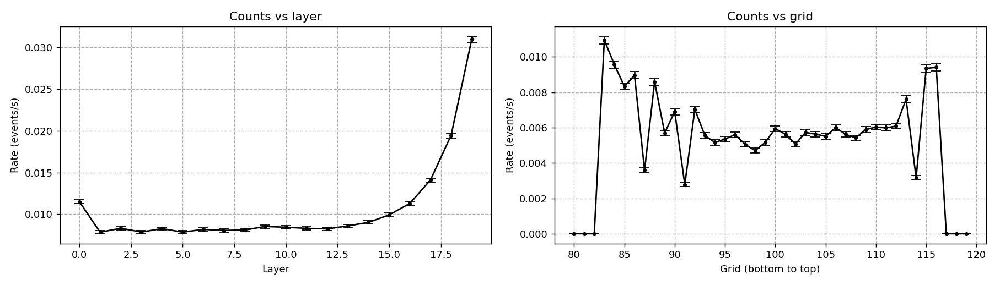

<IPython.core.display.Javascript object>


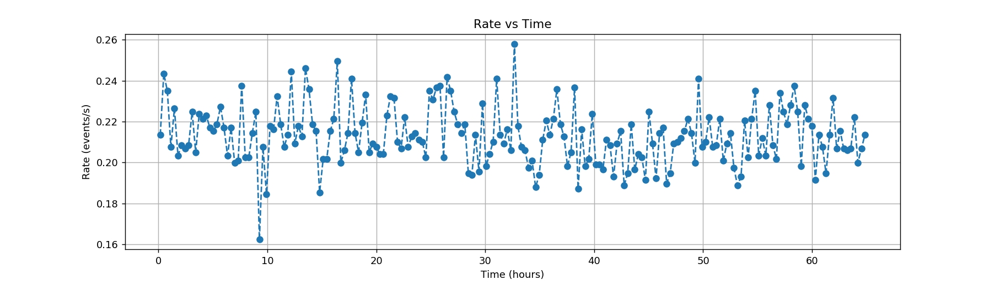

In [12]:
bus_start, bus_stop = 2, 4
plot_all(ra_mb_front_clu, ra_mb_front_ev, filter_no_edges_high_adc_thres_2_4, bus_start, bus_stop)

### 3.3.3 SEQ I, Mirrorbor shielding (front & back) - horizontal

<IPython.core.display.Javascript object>


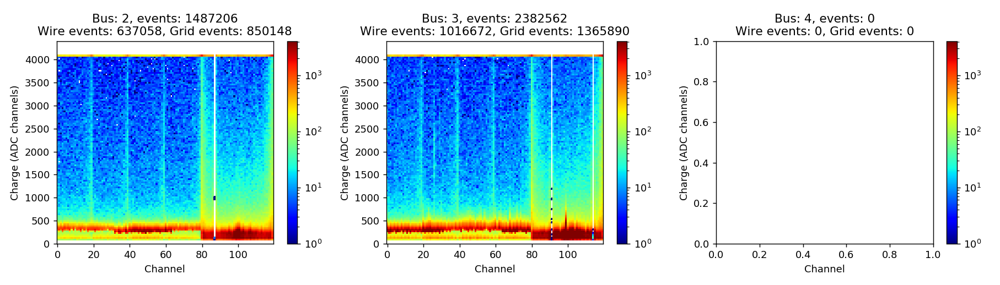

<IPython.core.display.Javascript object>


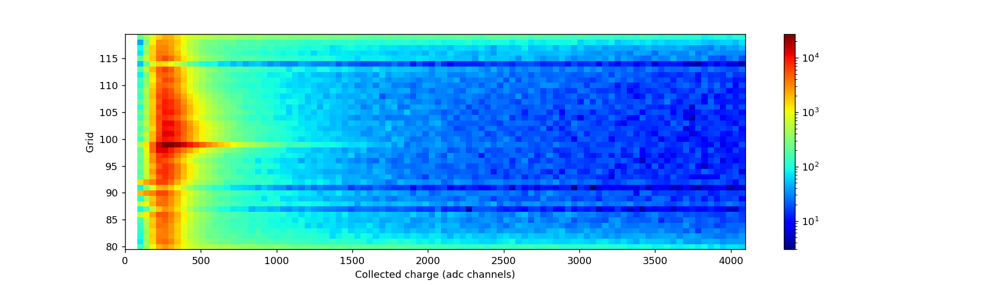

<IPython.core.display.Javascript object>


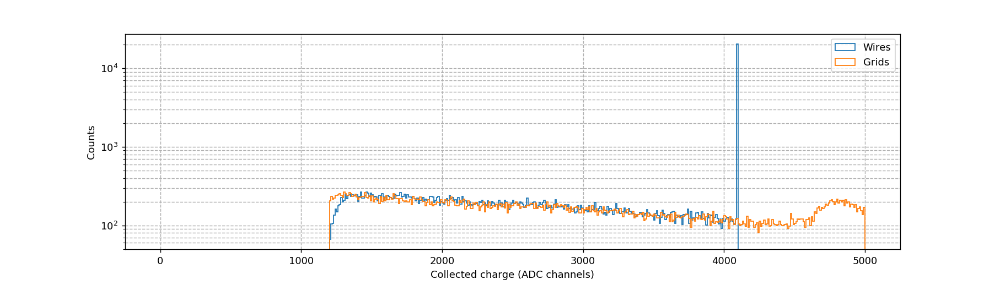

<IPython.core.display.Javascript object>


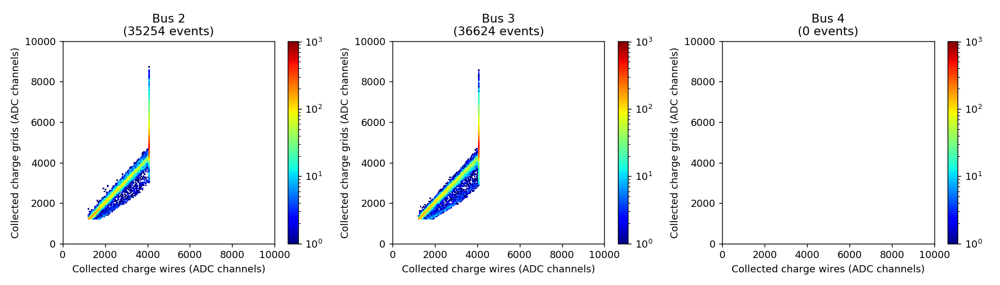

<IPython.core.display.Javascript object>


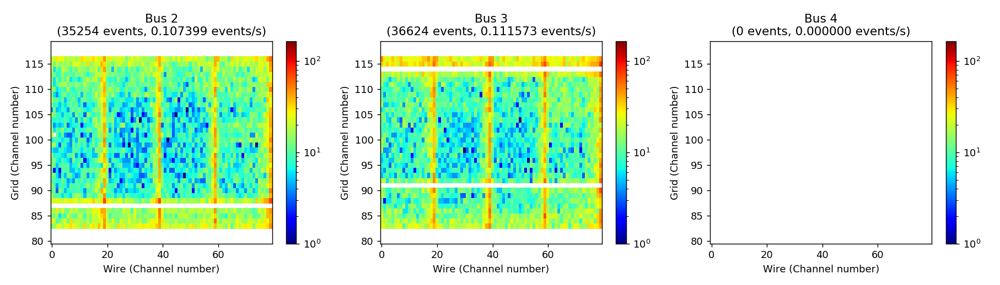

<IPython.core.display.Javascript object>


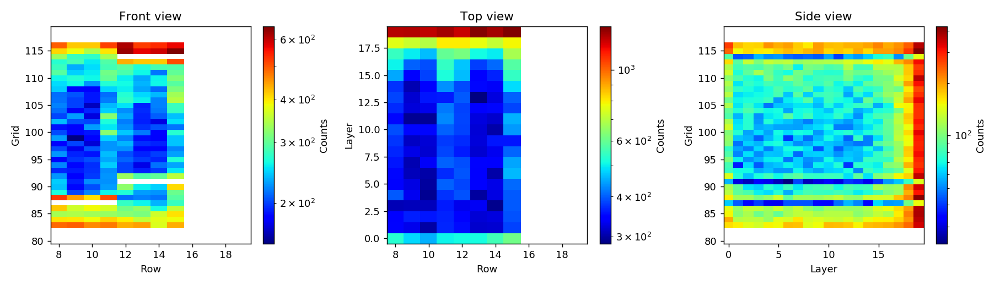

<IPython.core.display.Javascript object>


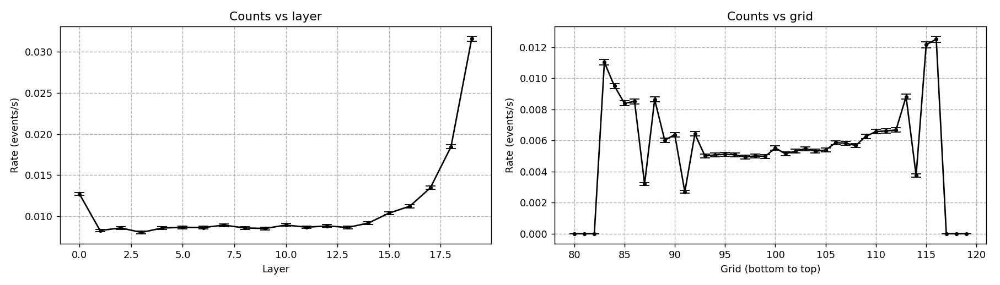

<IPython.core.display.Javascript object>


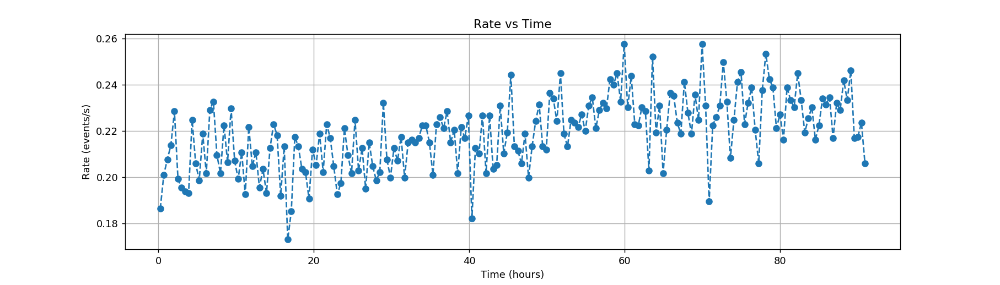

In [13]:
bus_start, bus_stop = 2, 4
plot_all(ra_mb_front_back_2_clu, ra_mb_front_back_2_ev, filter_no_edges_high_adc_thres_2_4, bus_start, bus_stop)

### 3.3.4 SEQ I, Inside new cave

<IPython.core.display.Javascript object>


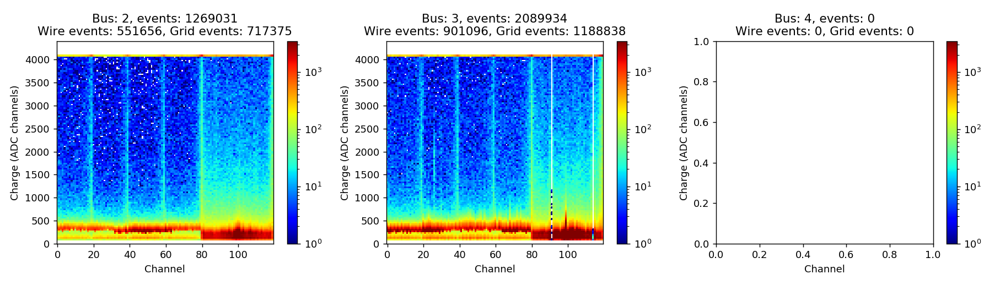

<IPython.core.display.Javascript object>


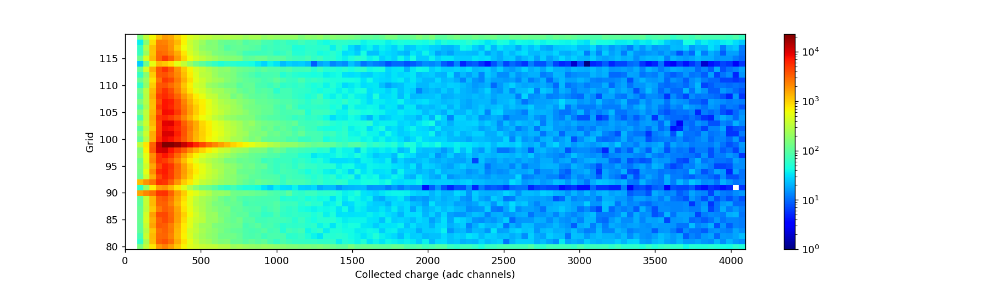

<IPython.core.display.Javascript object>


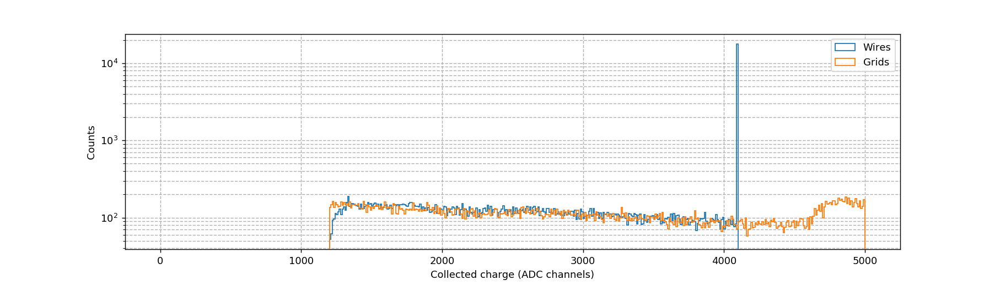

<IPython.core.display.Javascript object>


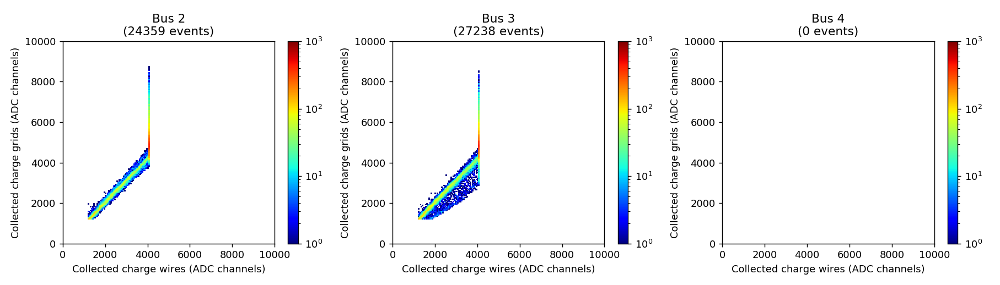

<IPython.core.display.Javascript object>


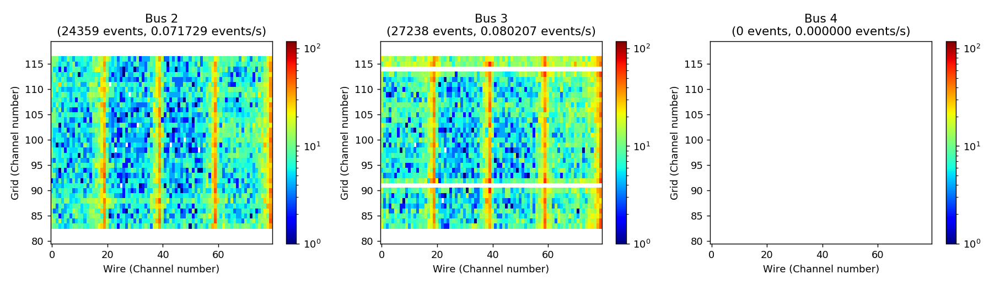

<IPython.core.display.Javascript object>


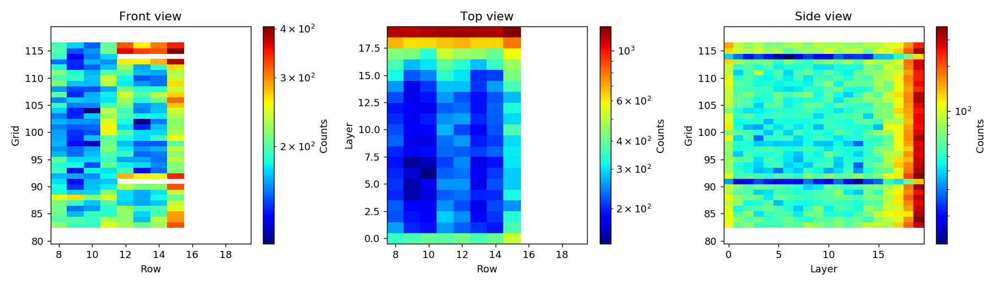

<IPython.core.display.Javascript object>


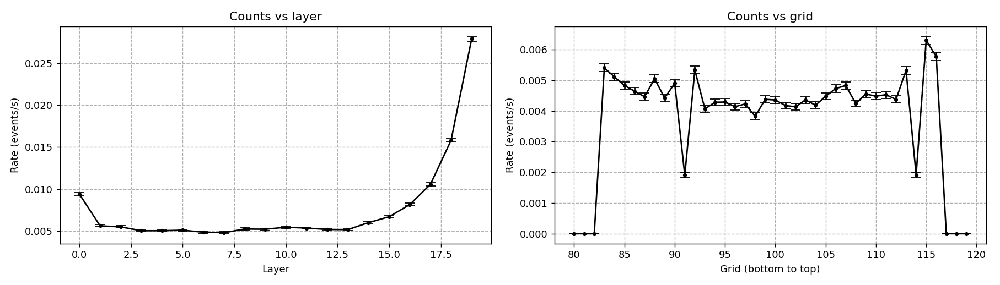

<IPython.core.display.Javascript object>


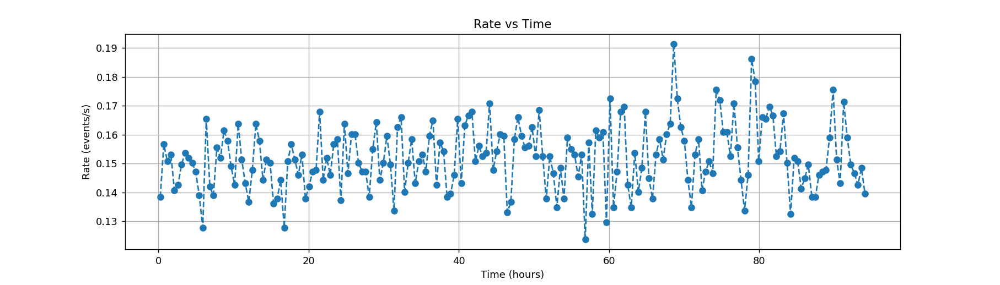

In [14]:
bus_start, bus_stop = 2, 4
plot_all(ra_mb_new_cave_clu, ra_mb_new_cave_ev, filter_no_edges_high_adc_thres_2_4, bus_start, bus_stop)

### 3.3.5 SEQ.II, Mirrorbor + polyethylene shielding (front, back & sides) - horizontal

<IPython.core.display.Javascript object>


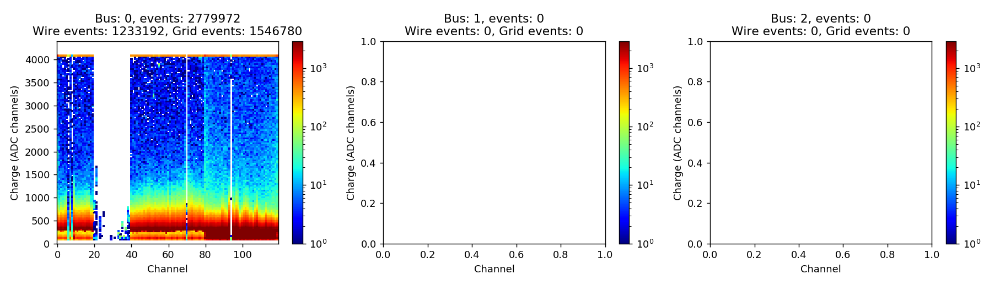

<IPython.core.display.Javascript object>


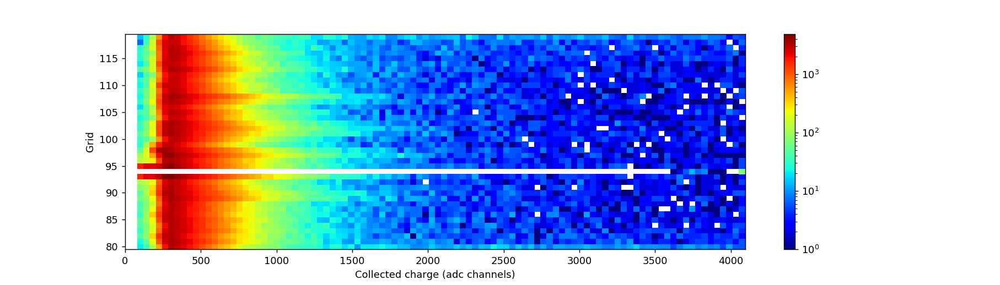

<IPython.core.display.Javascript object>


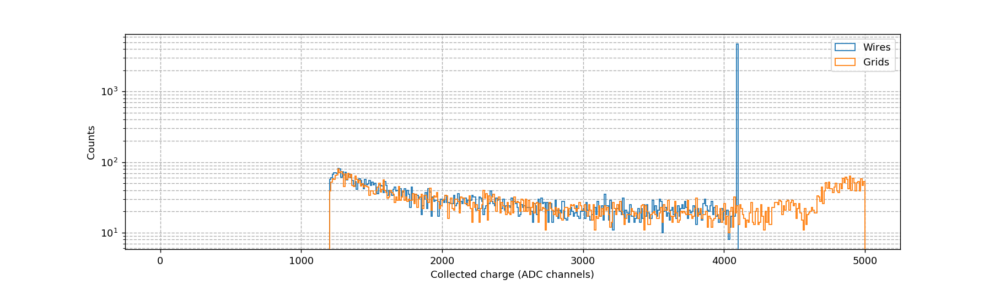

<IPython.core.display.Javascript object>


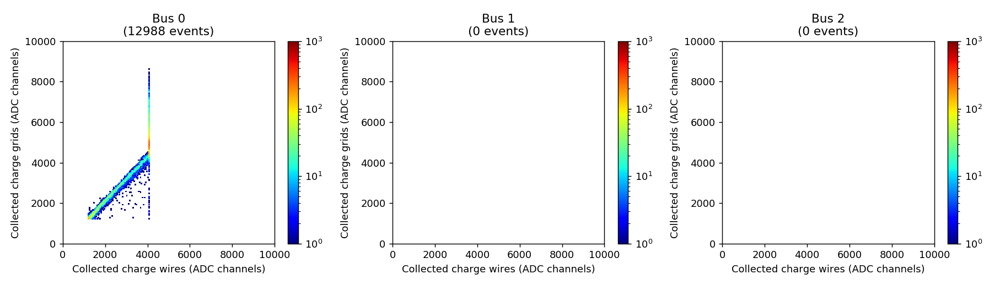

<IPython.core.display.Javascript object>


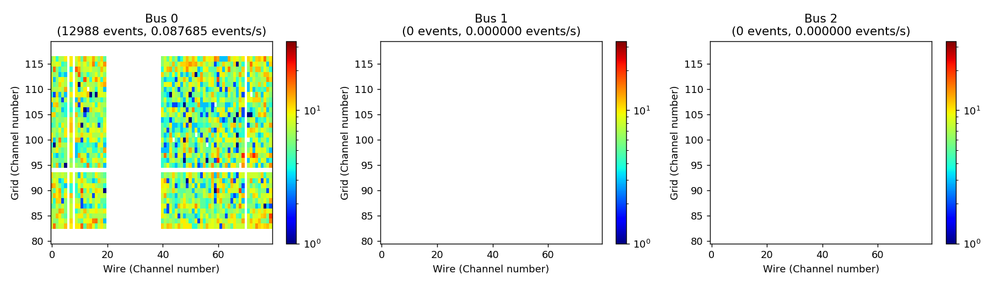

<IPython.core.display.Javascript object>


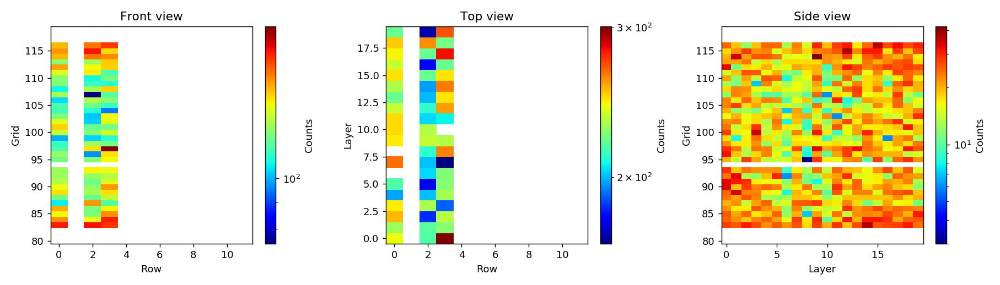

<IPython.core.display.Javascript object>


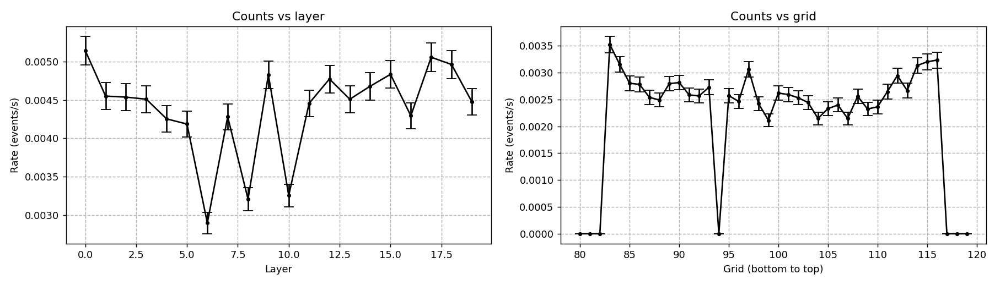

<IPython.core.display.Javascript object>


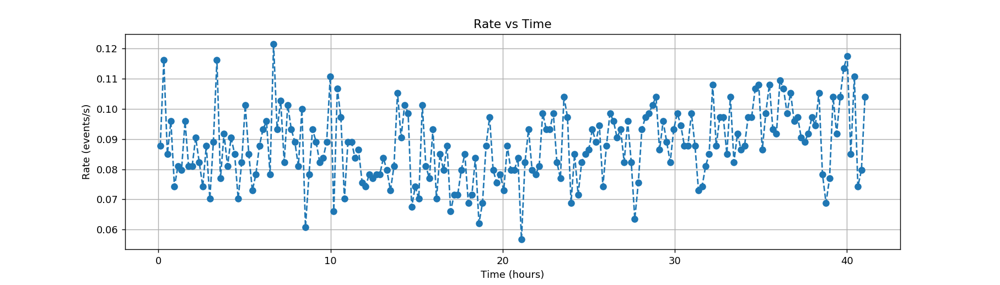

In [15]:
bus_start, bus_stop = 0, 2
plot_all(ra_mb_seqII_mb_pe_clu, ra_mb_seqII_mb_pe_ev, filter_no_edges_high_adc_thres_0_1, bus_start, bus_stop)

## 4. Analysis<a class="anchor" id="ANALYSIS"></a>

### Acknowledgements

### References